In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600

import warnings
warnings.filterwarnings('ignore')

In [29]:
rowwise = pd.read_csv("./data/out/rowwise.csv")
colwise = pd.read_csv("./data/out/colwise.csv")
blockwise = pd.read_csv("./data/out/blockwise.csv")

print(rowwise.shape, colwise.shape, blockwise.shape)

typenames = ['rowwise', 'colwise', 'blockwise']

(45, 4) (45, 4) (45, 4)


In [30]:
def add_metrics(data):
    def count_speed_up(data: pd.DataFrame):
        new_data = pd.DataFrame()
        for n_rows in data['n_rows'].unique():
            local = data.query('n_rows == @n_rows')
            single_time = local[local['n_processes'] == 1]['time'].iloc[0]
            sup = []
            local['speed_up'] = single_time / local['time']
    
            new_data = pd.concat([new_data, local], axis=0)
    
        new_data = new_data.sort_values(by=['n_processes', 'n_rows'])    
        return new_data
    
    def count_efficiency(data: pd.DataFrame):
        new_data = data.copy()
        new_data['efficiency'] = new_data['speed_up'] / new_data['n_processes']
        
        return new_data  

    data = count_speed_up(data)
    data = count_efficiency(data)

    return data

In [31]:
rowwise = add_metrics(rowwise)
colwise = add_metrics(colwise)
blockwise = add_metrics(blockwise)

print(rowwise.shape, colwise.shape, blockwise.shape)

datalist = [rowwise, colwise, blockwise]

(45, 6) (45, 6) (45, 6)


In [32]:
blockwise

,n_rows,n_cols,n_processes,time,speed_up,efficiency
0,600,600,1,0.001020,1.000000,1.000000
1,1800,1800,1,0.009474,1.000000,1.000000
2,3000,3000,1,0.026977,1.000000,1.000000
3,4200,4200,1,0.051229,1.000000,1.000000
4,5400,5400,1,0.085472,1.000000,1.000000
5,6600,6600,1,0.127010,1.000000,1.000000
6,7800,7800,1,0.176953,1.000000,1.000000
7,9000,9000,1,0.235573,1.000000,1.000000
8,10200,10200,1,0.304453,1.000000,1.000000
9,600,600,2,0.000802,1.271820,0.635910


<Axes: xlabel='n_rows', ylabel='time'>

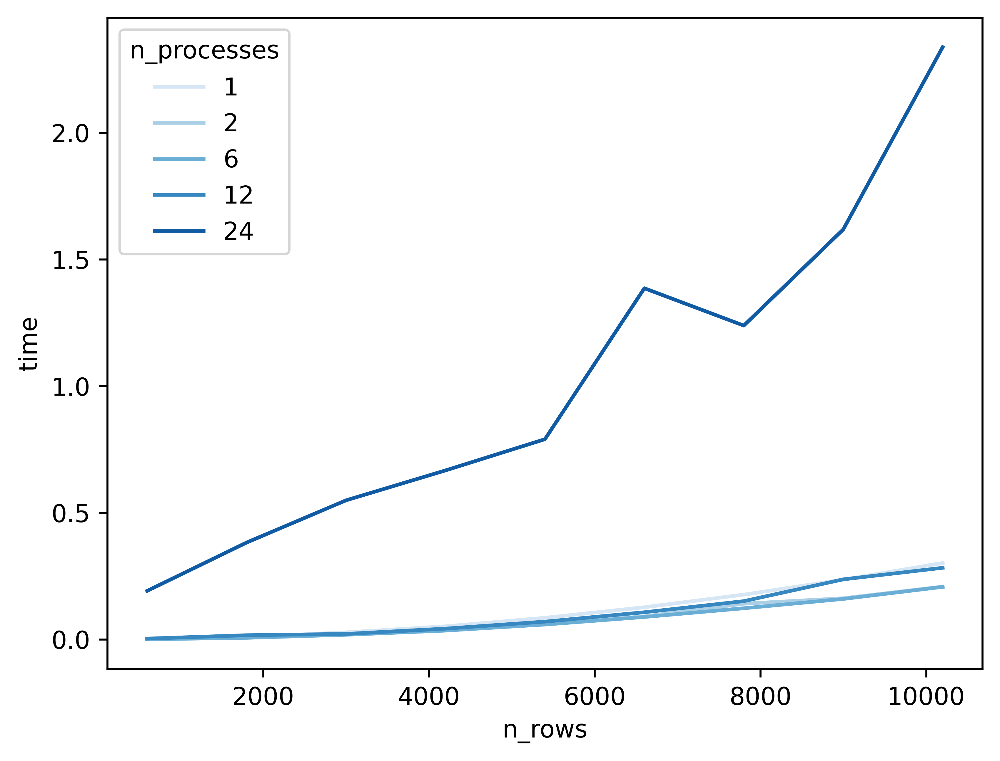

In [48]:
sns.lineplot(
    data,
    x='n_rows',
    y=metr,
    hue='n_processes',
    palette=sns.color_palette('Blues', n_colors=data['n_processes'].nunique()),
)

In [59]:
fig, axes = plt.subplots(3, 3, figsize=(18, 30))

for i, data in enumerate(datalist):
    for j, metr in enumerate(['time', 'speed_up', 'efficiency']):
        # g = sns.lineplot(
        #     data,
        #     x='n_rows',
        #     y=metr,
        #     hue='n_processes',
        #     palette=sns.color_palette('Blues', n_colors=data['n_processes'].nunique()),
        #     ax=axes[i][j],
        # )
    
        # s = typenames[i]
        
        # plt.title(f"The impact of the data of different size on {metr.capitalize()} \n for {s.upper()} algorithm", fontdict={'fontweight': 'bold'})
        # plt.xticks(ticks=rowwise['n_rows'].unique(), labels=rowwise['n_rows'].unique())
    
    
        g = sns.lineplot(
            data,
            x='n_processes',
            y=metr,
            hue='n_rows',
            palette=sns.color_palette('Spectral', n_colors=data['n_rows'].nunique())[::-1],
            ax=axes[i][j],
        )
    
        s = typenames[i]
        
        g.set_title(f"The impact of different number of processes \n on {metr.capitalize()} for {s.upper()} algorithm", fontdict={'fontweight': 'bold'})
        g.set_xticklabels(rowwise['n_processes'].unique(), horizontalalignment='left')
        g.set_xticks(rowwise['n_processes'].unique())
        g.set_xlabel('n_processes', fontdict={'fontweight': 'bold'})
        g.set_ylabel(metr, fontdict={'fontweight': 'bold'})
    

plt.show()

---

In [18]:
stat.columns

Index(['n_rows', 'n_cols', 'n_processes', 'time_rowwise', 'speed_up_rowwise',
       'efficiency_rowwise', 'time_colwise', 'speed_up_colwise',
       'efficiency_colwise', 'time_blockwise', 'speed_up_blockwise',
       'efficiency_blockwise'],
      dtype='object')

In [16]:
rowwise.columns = [col + '_rowwise' for col in rowwise.columns]
colwise.columns = [col + '_colwise' for col in colwise.columns]
blockwise.columns = [col + '_blockwise' for col in blockwise.columns]

stat = rowwise.join(colwise).join(blockwise)
stat = stat.drop(columns=['n_processes_blockwise', 'n_cols_blockwise', 'n_rows_blockwise', 'n_processes_colwise', 'n_cols_colwise', 'n_rows_colwise'])
stat.rename(columns={'n_rows_rowwise': 'n_rows', 'n_cols_rowwise': 'n_cols', 'n_processes_rowwise': 'n_processes'}, inplace=True)
stat.head(5)

,n_rows,n_cols,n_processes,time_rowwise,speed_up_rowwise,efficiency_rowwise,time_colwise,speed_up_colwise,efficiency_colwise,time_blockwise,speed_up_blockwise,efficiency_blockwise
0,600,600,1,0.001010,1.0,1.0,0.002475,1.0,1.0,0.001020,1.0,1.0
1,1800,1800,1,0.009373,1.0,1.0,0.022121,1.0,1.0,0.009474,1.0,1.0
2,3000,3000,1,0.027865,1.0,1.0,0.065752,1.0,1.0,0.026977,1.0,1.0
3,4200,4200,1,0.051675,1.0,1.0,0.139383,1.0,1.0,0.051229,1.0,1.0
4,5400,5400,1,0.085288,1.0,1.0,0.233374,1.0,1.0,0.085472,1.0,1.0


In [24]:
fig, axes = plt.subplots(5, 3, figsize=(18, 30))

for i, n_proc in enumerate(stat['n_processes'].unique()):
    for j, metr in enumerate(['time', 'speed_up', 'efficiency']):
        cur_stat = stat.query('n_processes == @n_proc')
        
        axes[i][j].plot(cur_stat['n_rows'], cur_stat[f'{metr}_rowwise'], label='rowwise')
        axes[i][j].plot(cur_stat['n_rows'], cur_stat[f'{metr}_colwise'], label='colwise')
        axes[i][j].plot(cur_stat['n_rows'], cur_stat[f'{metr}_blockwise'], label='blockwise')

        axes[i][j].set_title(f'Dependence of {metr.capitalize()} \n on the number of `n_rows` being executed on {n_proc} processes', fontdict={'fontweight': 'bold'})
        
        axes[i][j].legend()
        
        axes[i][j].set_xticks(ticks=stat['n_rows'].unique(), labels=stat['n_rows'].unique())
        axes[i][j].set_xlabel('n_rows', fontdict={'fontweight': 'bold'})
        axes[i][j].set_ylabel(metr, fontdict={'fontweight': 'bold'})


plt.tight_layout()